# Individual analysis between "feature x categorical" and "target y Continuous" 
### [feature vs target]
- tables
- plots

In [1]:
import os
# fix root path to save outputs
actual_path = os.path.abspath(os.getcwd())
list_root_path = actual_path.split('/')[:-1]
root_path = '/'.join(list_root_path)
os.chdir(root_path)
print('root path: ', root_path)

root path:  /Users/joseortega/Documents/GitHub/exploratory-data-analysis-ds


### 0. Package and load data

In [2]:
from sklearn.datasets import fetch_california_housing
import json
import pandas as pd
import numpy as np

# plotly
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

#### load data categorical features and target generated by percentiles
This is generated in the notebook 0

In [3]:
data_percentile_feature_target = pd.read_pickle('data/df_cat_feature_target.pkl')
data_percentile_feature_target.head()

,quartile_MedInc,quartile_HouseAge,quartile_AveRooms,quartile_AveBedrms,quartile_Population,quartile_AveOccup,quartile_Latitude,quartile_Longitude,quartile_Price
0,q4 - (4.74-15.0),q4 - (37.0-52.0),q4 - (6.05-141.91),q2 - (1.01-1.05),q1 - (3.0-787.0),q2 - (2.43-2.82),q4 - (37.71-41.95),q1 - (-124.35--121.8),q4 - (2.65-5.0)
1,q4 - (4.74-15.0),q2 - (18.0-29.0),q4 - (6.05-141.91),q1 - (0.33-1.01),q4 - (1725.0-35682.0),q1 - (0.69-2.43),q4 - (37.71-41.95),q1 - (-124.35--121.8),q4 - (2.65-5.0)
2,q4 - (4.74-15.0),q4 - (37.0-52.0),q4 - (6.05-141.91),q3 - (1.05-1.1),q1 - (3.0-787.0),q2 - (2.43-2.82),q4 - (37.71-41.95),q1 - (-124.35--121.8),q4 - (2.65-5.0)
3,q4 - (4.74-15.0),q4 - (37.0-52.0),q3 - (5.23-6.05),q3 - (1.05-1.1),q1 - (3.0-787.0),q2 - (2.43-2.82),q4 - (37.71-41.95),q1 - (-124.35--121.8),q4 - (2.65-5.0)
4,q3 - (3.53-4.74),q4 - (37.0-52.0),q4 - (6.05-141.91),q3 - (1.05-1.1),q1 - (3.0-787.0),q1 - (0.69-2.43),q4 - (37.71-41.95),q1 - (-124.35--121.8),q4 - (2.65-5.0)


#### load data categorical only features generated by percentiles
This is generated in the notebook 0

In [4]:
data_percentile_feature = pd.read_pickle('data/df_cat_feature.pkl')
data_percentile_feature.head()

,Price,quartile_MedInc,quartile_AveBedrms,quartile_HouseAge,quartile_Latitude,quartile_Population,quartile_Longitude,quartile_AveOccup,quartile_AveRooms
0,4.526,q4 - (4.74-15.0),q2 - (1.01-1.05),q4 - (37.0-52.0),q4 - (37.71-41.95),q1 - (3.0-787.0),q1 - (-124.35--121.8),q2 - (2.43-2.82),q4 - (6.05-141.91)
1,3.585,q4 - (4.74-15.0),q1 - (0.33-1.01),q2 - (18.0-29.0),q4 - (37.71-41.95),q4 - (1725.0-35682.0),q1 - (-124.35--121.8),q1 - (0.69-2.43),q4 - (6.05-141.91)
2,3.521,q4 - (4.74-15.0),q3 - (1.05-1.1),q4 - (37.0-52.0),q4 - (37.71-41.95),q1 - (3.0-787.0),q1 - (-124.35--121.8),q2 - (2.43-2.82),q4 - (6.05-141.91)
3,3.413,q4 - (4.74-15.0),q3 - (1.05-1.1),q4 - (37.0-52.0),q4 - (37.71-41.95),q1 - (3.0-787.0),q1 - (-124.35--121.8),q2 - (2.43-2.82),q3 - (5.23-6.05)
4,3.422,q3 - (3.53-4.74),q3 - (1.05-1.1),q4 - (37.0-52.0),q4 - (37.71-41.95),q1 - (3.0-787.0),q1 - (-124.35--121.8),q1 - (0.69-2.43),q4 - (6.05-141.91)


#### Define data to use in the example, list features, target
In this notebooks only matters the features, so any of the two datasets can be used

In [5]:
data = data_percentile_feature.copy()

### target
target = 'Price'

### list_features
list_features = list(set(data.columns.tolist()) - set([target]))

In [6]:
# ##### features
# # list original features
# list_features_original= ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude', 'Price']

# # list transformation percentile each feature
# list_features_percentile_transformation = ['quartile', 'quartile', 'quartile', 'quartile', 'quartile', 'quartile', 'quartile', 'quartile', 'quartile']

# ##### target
# list_target_original = ['Price']
# list_target_percentile_transformation = ['quartile']

In [7]:
# # get the list of feature and target used to this analysis. 
# ### ----> features discrete. target continous
# list_features_discrete = [list_features_percentile_transformation[index]+'_'+list_features_original[index] \
#                           for index in range(len(list_features_original))]

# list_target_continous = list_target_original

# print('list_features: ', list_features_discrete)
# print('\nlist_target: ', list_target_continous)

### 2. sinthetize descriptive statistics target for each feature categorical
### analysis I. descriptive statistics target for each feature categorical
Descriptive statistics

In [8]:
def descriptive_statistics_target_for_each_feature(df, target):
    """
    Calculate descriptive statistics of target for each feature categorical (and for each category in each feature)

    Args:
        df (dataframe): input dataframe
        target (string): string to target that will be calcuated its statistics

    Return:
        df_statistics_target (dataframe): dataframe with the statistics of the target
        df_statistics_target_to_plotly (dataframe): dataframe with the statistics of the target adapted to show in a plotly graph
    """
    
    ### list_features
    list_features = list(set(df.columns.tolist()) - set([target]))
    
    ###### generate descriptive statistics of the target for each percentil of each feature
    df_statistics_target = pd.DataFrame()
    for feature in list_features:
        #print(feature)
        
        # calculate statistic descriptive of target for a categories of a feature
        aux_statistics_target = df.groupby(feature)[target].describe()
        
        # set multiindex (feature, percentile_feature)
        aux_statistics_target.index = pd.MultiIndex.from_product([
            [feature], 
            aux_statistics_target.index.tolist()
        ] )
        
        # join in a unique dataframe
        df_statistics_target = pd.concat([df_statistics_target, aux_statistics_target], axis = 0)
    
    
    ##### round to 3 decimals
    df_statistics_target.round(2)
    
    
    #### tranform output dataframe into format to plotly
    df_statistics_target_to_plotly = df_statistics_target.reset_index()
    df_statistics_target_to_plotly.loc[df_statistics_target_to_plotly['level_0'].duplicated(), 'level_0'] = '' # delete duplicated rows
    
    return df_statistics_target, df_statistics_target_to_plotly

def plot_df_table_plotly(df_to_plotly):
    """
    Given a dataframe, transform into a plotly table
    Args
        df_to_plotly (dataframe): dataframe that will be transformed into plotly table

    Return
        table_fig (figure plotly): fig of plotly with the plot generated
    """
    table_fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_to_plotly.columns),
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[df_to_plotly[col] for col in df_to_plotly.columns],
               fill_color='lavender',
               align='left'))
    ])
    return table_fig

In [9]:
# generate dataframe statistics target
df_statistics_target, df_statistics_target_to_plotly = descriptive_statistics_target_for_each_feature(df = data_percentile_feature,
                                                                                                 target = target
                                                                                                 )

# transform into plotly table
fig_table_statistics_target_to_plotly = plot_df_table_plotly(df_statistics_target_to_plotly)

# save as plotly image and a excel table
fig_table_statistics_target_to_plotly.write_html("output_eda/5_categorical_analysis/table_statistics_target.html")
df_statistics_target.to_excel("output_eda/5_categorical_analysis/dstatistics_target.xlsx")

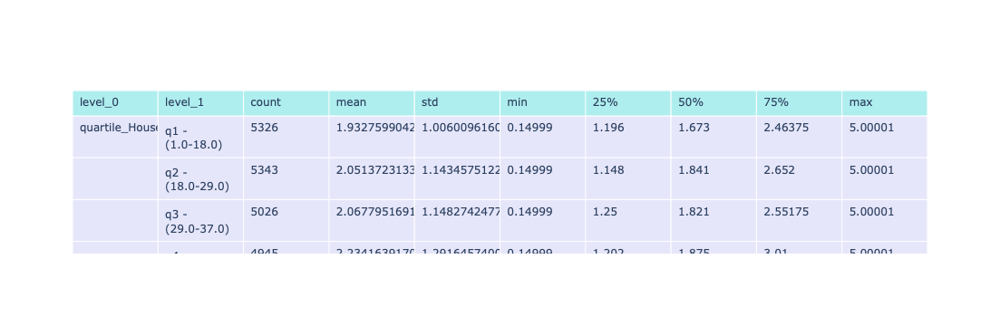

In [10]:
# show plotly table
fig_table_statistics_target_to_plotly.show()

In [11]:
# show dataframe
df_statistics_target

count      mean       std  \
quartile_HouseAge   q1 - (1.0-18.0)         5326.0  1.932760  1.006010   
                    q2 - (18.0-29.0)        5343.0  2.051372  1.143458   
                    q3 - (29.0-37.0)        5026.0  2.067795  1.148274   
                    q4 - (37.0-52.0)        4945.0  2.234164  1.291646   
quartile_MedInc     q1 - (0.5-2.56)         5160.0  1.229929  0.705237   
                    q2 - (2.56-3.53)        5160.0  1.718111  0.820389   
                    q3 - (3.53-4.74)        5160.0  2.158627  0.924747   
                    q4 - (4.74-15.0)        5160.0  3.167567  1.122158   
quartile_Longitude  q1 - (-124.35--121.8)   5165.0  2.444254  1.211441   
                    q2 - (-121.8--118.49)   5198.0  1.556490  1.017249   
                    q3 - (-118.49--118.01)  5132.0  2.363008  1.145208   
                    q4 - (-118.01--114.31)  5145.0  1.915039  0.999534   
quartile_AveOccup   q1 - (0.69-2.43)        5160.0  2.444089  1.297444   
                    q2 - (2.43-2.82)        5160.0  2.191116  1.200274   
                    q3 - (2.82-3.28)        5160.0  2.024633  1.072332   
                    q4 - (3.28-1243.33)     5160.0  1.614395  0.830067   
quartile_Population q1 - (3.0-787.0)        5164.0  2.117733  1.286290   
                    q2 - (787.0-1166.0)     5161.0  2.124931  1.199842   
                    q3 - (1166.0-1725.0)    5159.0  2.031766  1.114453   
                    q4 - (1725.0-35682.0)   5156.0  1.999693  0.989347   
quartile_AveRooms   q1 - (0.85-4.44)        5160.0  1.823917  0.968576   
                    q2 - (4.44-5.23)        5160.0  1.780122  1.001161   
                    q3 - (5.23-6.05)        5161.0  1.945912  1.029809   
                    q4 - (6.05-141.91)      5159.0  2.724433  1.318371   
quartile_Latitude   q1 - (32.54-33.93)      5192.0  2.185911  1.058820   
                    q2 - (33.93-34.26)      5197.0  2.259153  1.176366   
                    q3 - (34.26-37.71)      5094.0  2.034567  1.226951   
                    q4 - (37.71-41.95)      5157.0  1.791911  1.091725   
quartile_AveBedrms  q1 - (0.33-1.01)        5160.0  2.143057  1.122579   
                    q2 - (1.01-1.05)        5170.0  2.175132  1.125212   
                    q3 - (1.05-1.1)         5151.0  2.096751  1.161399   
                    q4 - (1.1-34.07)        5159.0  1.859095  1.179265   

                                                min      25%     50%      75%  \
quartile_HouseAge   q1 - (1.0-18.0)         0.14999  1.19600  1.6730  2.46375   
                    q2 - (18.0-29.0)        0.14999  1.14800  1.8410  2.65200   
                    q3 - (29.0-37.0)        0.14999  1.25000  1.8210  2.55175   
                    q4 - (37.0-52.0)        0.14999  1.20200  1.8750  3.01000   
quartile_MedInc     q1 - (0.5-2.56)         0.14999  0.73875  1.0395  1.52425   
                    q2 - (2.56-3.53)        0.22500  1.13300  1.5630  2.09025   
                    q3 - (3.53-4.74)        0.14999  1.52900  1.9330  2.57200   
                    q4 - (4.74-15.0)        0.47500  2.29375  2.9525  4.00000   
quartile_Longitude  q1 - (-124.35--121.8)   0.14999  1.50200  2.3180  3.21300   
                    q2 - (-121.8--118.49)   0.22500  0.83300  1.2500  1.98400   
                    q3 - (-118.49--118.01)  0.17500  1.54900  2.0190  2.95125   
                    q4 - (-118.01--114.31)  0.14999  1.22400  1.6810  2.33900   
quartile_AveOccup   q1 - (0.69-2.43)        0.14999  1.37750  2.2210  3.35225   
                    q2 - (2.43-2.82)        0.14999  1.22775  1.9610  2.86125   
                    q3 - (2.82-3.28)        0.14999  1.21400  1.8445  2.53825   
                    q4 - (3.28-1243.33)     0.22500  1.04600  1.5205  1.90000   
quartile_Population q1 - (3.0-787.0)        0.14999  1.09775  1.7920  2.78500   
                    q2 - (787.0-1166.0)     0.26600  1.18100  1.8510  2.75000   
                    q3 - (1166.0-1725.0)    0.22500  1.19600  1

### 2. sinthetize individual plot

#### analysis II. individual plot histogram of target colored by percentile of a feature

In [12]:
def plot_individual_hist_target_categorical_features(df, var_categorical, var_continuous_hist):
    """
    Plot individual hist of a variable (target in this example) colored by different categories of a feature (categorical variable)
    Args
        df (dataframe): input dataframe
        var_categorical (string): name of the column in the input dataframe that indicate the differents categories in the data
        var_continuous_hist (string): name of the feature in the input dataframe that will plot its histogram

    Return
        fig (figure plotly): fig of plotly with the plot generated
    """
    # sort data before plot - to show de categories in categorical variable in order
    df_sorted = df.sort_values(by = [var_categorical], ascending = True)
    
    fig = px.histogram(df_sorted, x = var_continuous_hist, color = var_categorical, barmode='overlay', opacity=0.4)

    # update title
    fig.update_layout(
      title_text = f'Histogram: {var_continuous_hist} by percentil of {var_categorical}',
      title_x = 0.5, # centrar titulo
      title_font = dict(size = 20)
    )
    return fig

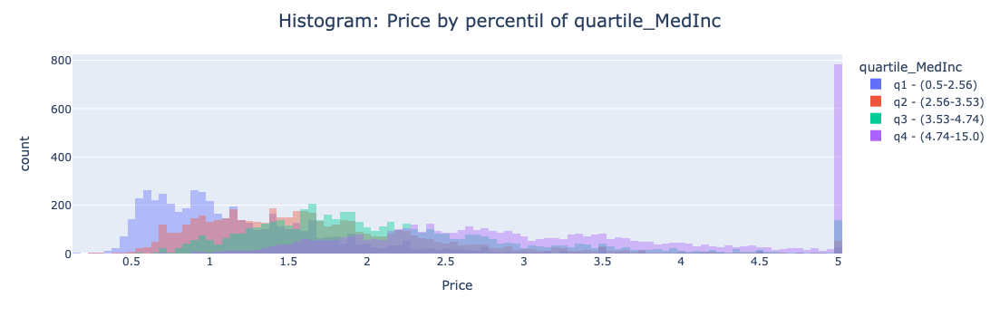

In [13]:
feature_cat_ = 'quartile_MedInc'
fig_individual_hist = plot_individual_hist_target_categorical_features(df = data_percentile_feature, 
                                              var_continuous_hist = target, 
                                               var_categorical = feature_cat_)

fig_individual_hist.show()

fig_individual_hist.write_html("output_eda/5_categorical_analysis/individual_histogram.html")

#### analysis III. individual boxplot of target colored by percentile of a feature

In [14]:
def plot_individual_boxplot_target_categorical_features(df, var_categorical, var_continuous_hist):
    """
    Plot individual boxplot of a variable (target in this example) colored by different categories of a feature (categorical variable)
    Args
        df (dataframe): input dataframe
        var_categorical (string): name of the column in the input dataframe that indicate the differents categories in the data
        var_continuous_hist (string): name of the feature in the input dataframe that will plot its histogram

    Return
        fig (figure plotly): fig of plotly with the plot generated
    """
    # sort data before plot - to show de categories of categorical variable in order
    df_sorted = df.sort_values(by = [var_categorical], ascending = True)
    
    fig = go.Figure()
    fig.add_trace(go.Box(x=df_sorted[var_categorical], y=df_sorted[var_continuous_hist]))

    # update title
    fig.update_layout(
      title_text = f'Histogram: {var_continuous_hist} by percentil of {var_categorical}',
      title_x = 0.5, # centrar titulo
      title_font = dict(size = 20)
    )
    return fig

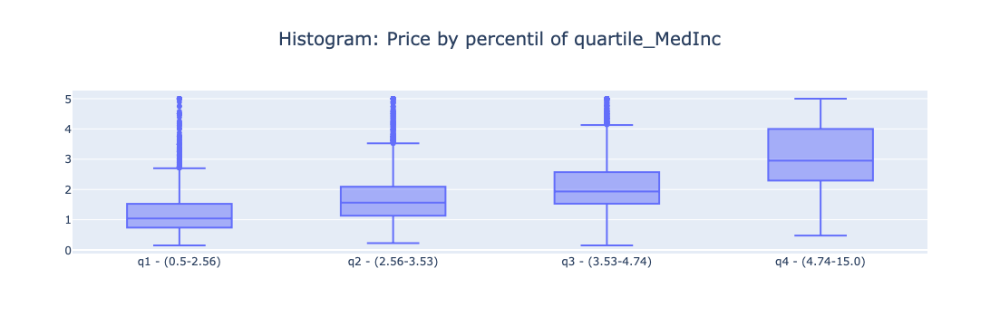

In [15]:
feature_cat_ = 'quartile_MedInc'
fig_individual_boxplot = plot_individual_boxplot_target_categorical_features(df = data_percentile_feature, 
                                              var_continuous_hist = target, 
                                               var_categorical = feature_cat_)

fig_individual_boxplot.show()

fig_individual_boxplot.write_html("output_eda/5_categorical_analysis/individual_histogram.html")

### 2. sinthetize subplots plot

#### analysis II. plot histogram of target colored by percentile of a feature

In [16]:
def plot_histogram_target_categorical_features(df, var_continuous_hist, number_columns = 2):
    """
    IT HAS ERROR - DEBUGGING IN PROGRESS
    
    Plot multiple histograms of the target (continous variable) colored individually for each feature in the dataframe (each feature is categorical)
    Differents colors in the histogram according the segmentation in the data
    
    Args
        df (datafame): input dataframe
        var_continuous_hist (string): name of the feature in the input dataframe that will plot its histogram

    Return
        fig (figure plotly): fig of plotly with the plot generated
    """
    # get list features
    list_features_target = df.columns.tolist()
    list_features = list(set(list_features_target) - set([var_continuous_hist]))


    # get number of rows (number row = number of data / number of columns)
    # (considering fixed the number of columns) 
    if (df.shape[1] % number_columns) != 0:
        number_rows = (df.shape[1] // number_columns) + 1 
    else:
        number_rows = (df.shape[1] // number_columns)


    ############################## 
    # Create los subplots
    fig = make_subplots(rows = number_rows, cols = number_columns, shared_xaxes=False, subplot_titles=list_features)

    # add each boxplot
    for index_feature, feature in enumerate(list_features):

        # obtener índices en el subplot (en plotly los índices comienzan en 1, por lo que debe sumarse un 1 a los resultados obtenidos)
        row = (index_feature // number_columns) + 1
        column = (index_feature % number_columns) + 1

        
        # -----> plot hist - bad results with plotly exprees
        # # generate histogram individual plotly express. fig_aux.data[index_percentile] where index_percentile is each perfentile in the feature
        # fig_aux = px.histogram(df, x = var_continuous_hist, color = feature, barmode='overlay', opacity=0.4)
        # for index_percentile in range(len(df[feature].cat.categories.tolist())):
        #     fig.add_trace(fig_aux.data[index_percentile],
        #             row = row,
        #             col = column)
        #     fig.update_yaxes(title_text = var_continuous_hist, row=row, col=column)

        
        # ----> plot hist - plotly object - error - debugging not finished
        fig.add_trace(go.Histogram(x = df[var_continuous_hist], name = feature, marker_color=df[feature], opacity=0.7), # barmode='overlay', 
                      row = row, col = column)
        
    # update layout
    fig.update_layout(height=len(list_features)*250, 
                      width=1600, 
                      title_text = "Boxplots of a target variable vs features categorized in percentil",
                      title_x = 0.5, # centrar titulo
                    title_font = dict(size = 28)
                     ) 
                     
    return fig

In [17]:
#### debugging in progress

# fig_hist_target_colored_cartegorical_features = plot_histogram_target_categorical_features(df = data_percentile_feature, 
#                                               var_continuous_hist = target, 
#                                                number_columns = 2)

# fig_hist_target_colored_cartegorical_features.write_html("output_eda/5_categorical_analysis/hist_target_colored_cartegorical_features.html")

# fig_hist_target_colored_cartegorical_features.show()

#### analysis III. boxplot of target colored by percentile of a feature

In [18]:
def plot_boxplots_target_categorical_features(df, var_continuous_hist, number_columns = 2):
    """
    Plot multiple boxplots of the target (continous variable) colored individually for each feature in the dataframe (each feature is categorical)
    Differents colors in the histogram according the segmentation in the data
    
    Args
        df (datafame): input dataframe
        var_continuous_hist (string): name of the feature in the input dataframe that will plot its histogram

    Return
        fig (figure plotly): fig of plotly with the plot generated
    """
    # get list features
    list_features_target = df.columns.tolist()
    list_features = list(set(list_features_target) - set([var_continuous_hist]))


    # get number of rows (number row = number of data / number of columns)
    # (considering fixed the number of columns) 
    if (df.shape[1] % number_columns) != 0:
        number_rows = (df.shape[1] // number_columns) + 1 
    else:
        number_rows = (df.shape[1] // number_columns)


    ############################## 
    # Create los subplots
    fig = make_subplots(rows = number_rows, cols = number_columns, shared_xaxes=False, subplot_titles=list_features)

    # add each boxplot
    for index_feature, feature in enumerate(list_features):

        # obtener índices en el subplot (en plotly los índices comienzan en 1, por lo que debe sumarse un 1 a los resultados obtenidos)
        row = (index_feature // number_columns) + 1
        column = (index_feature % number_columns) + 1

        # sort data by variable to plot. show categories of categorical varialble in order
        df_sorted = df.sort_values(by = [feature], ascending = True)
        
        # add trace boxplot
        fig.add_trace(go.Box(x=df_sorted[feature], y=df_sorted[var_continuous_hist]),
                row = row,
                col = column)
        fig.update_yaxes(title_text = var_continuous_hist, row=row, col=column)
        
    # update layout
    fig.update_layout(height = number_rows * 250,
                      width = number_columns * 800,
                      title_text = "Boxplots of a target variable vs features categorized in percentil",
                      title_x = 0.5, # centrar titulo
                    title_font = dict(size = 28)
                     ) 
                     
    return fig

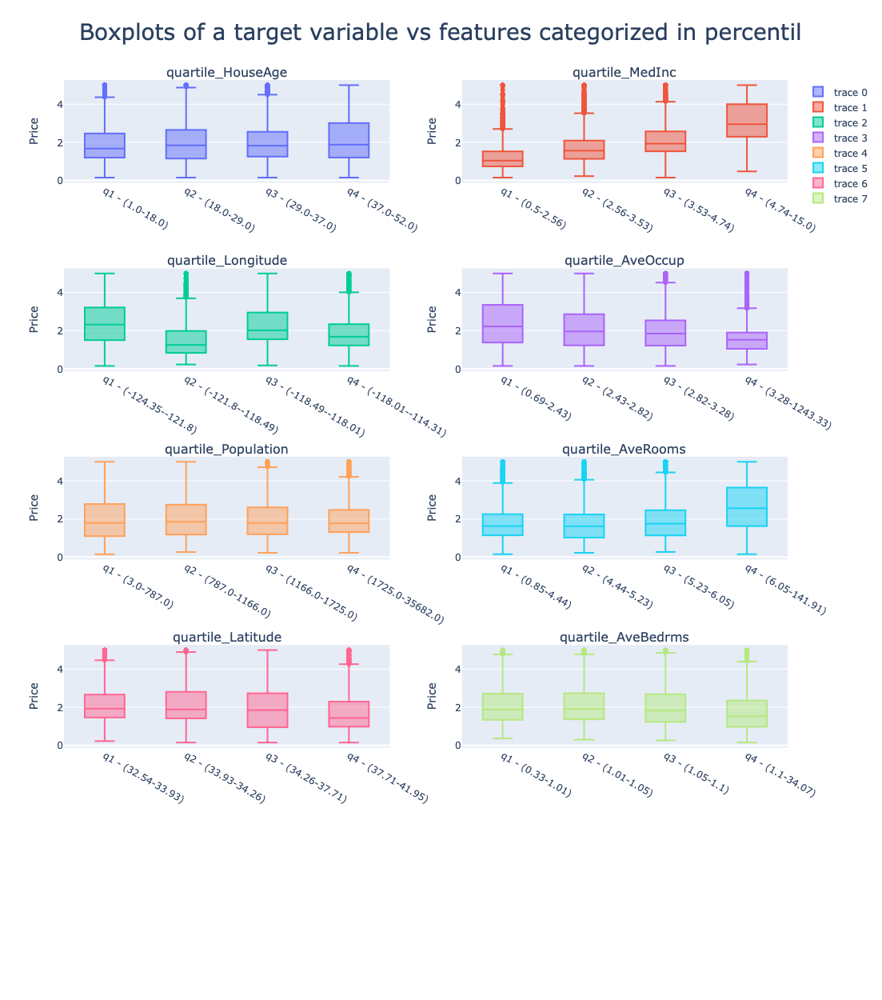

In [19]:
fig_boxplot_target_colored_cartegorical_features = plot_boxplots_target_categorical_features(df = data_percentile_feature, 
                                              var_continuous_hist = target, 
                                               number_columns = 2)

fig_boxplot_target_colored_cartegorical_features.write_html("output_eda/5_categorical_analysis/boxplot_target_colored_cartegorical_features.html")

fig_boxplot_target_colored_cartegorical_features.show()